# Лабораторная работа №2

Имплементация алгоритмов обработки изображений с нуля (NumPy).
Сравнение бок о бок с OpenCV.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
%matplotlib inline

## Загрузка изображений

Размер: (900, 1311, 3)


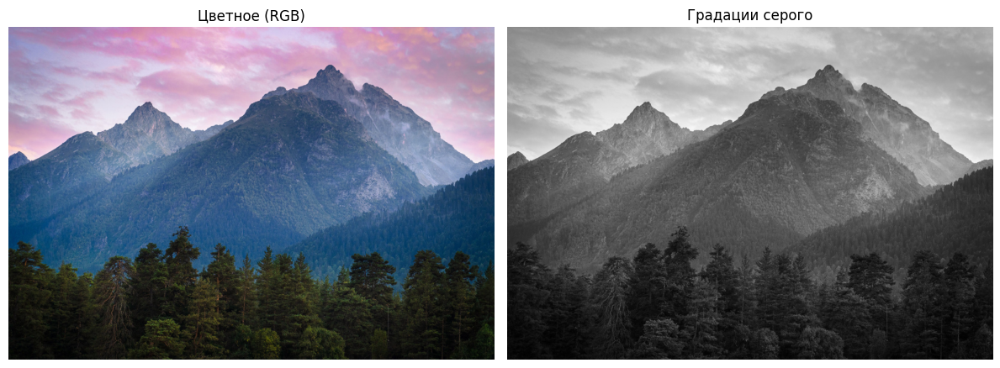

In [2]:
img_bgr = cv2.imread('DATA/lab_2/yuriy_ufimcev_fioletovyy_zakat_536530.jpg')
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

print('Размер:', img_rgb.shape)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_rgb)
axes[0].set_title('Цветное (RGB)')
axes[0].axis('off')
axes[1].imshow(gray, cmap='gray')
axes[1].set_title('Градации серого')
axes[1].axis('off')
plt.tight_layout()
plt.show()

---
## 1. Конвертация цветовых пространств

### RGB → HSV

C:\Users\valer\AppData\Local\Temp\ipykernel_43396\2456732734.py:21: RuntimeWarning: invalid value encountered in divide
  S = np.where(Cmax > 0, delta / Cmax, 0)


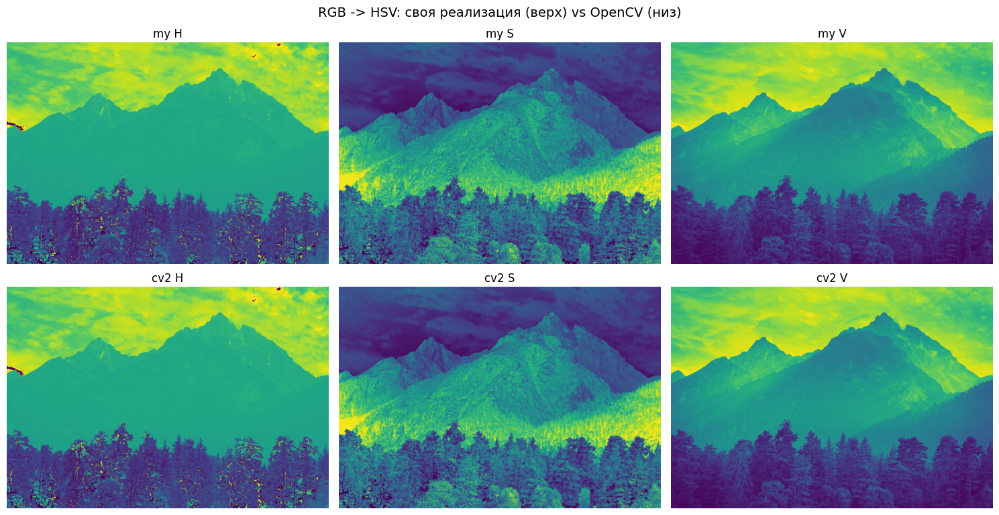

In [3]:
def my_rgb2hsv(img):
    f = img.astype(np.float64) / 255.0
    R, G, B = f[:,:,0], f[:,:,1], f[:,:,2]

    Cmax = np.max(f, axis=2)
    Cmin = np.min(f, axis=2)
    delta = Cmax - Cmin

    H = np.zeros_like(Cmax)
    mask = delta > 0

    m = mask & (Cmax == R)
    H[m] = 60.0 * (((G[m] - B[m]) / delta[m]) % 6)

    m = mask & (Cmax == G)
    H[m] = 60.0 * ((B[m] - R[m]) / delta[m] + 2)

    m = mask & (Cmax == B)
    H[m] = 60.0 * ((R[m] - G[m]) / delta[m] + 4)

    S = np.where(Cmax > 0, delta / Cmax, 0)

    V = Cmax

    hsv = np.stack([H / 2, S * 255, V * 255], axis=2)
    return np.clip(hsv, 0, 255).astype(np.uint8)

my_hsv = my_rgb2hsv(img_rgb)
cv_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for i, name in enumerate(['H', 'S', 'V']):
    axes[0, i].imshow(my_hsv[:,:,i])
    axes[0, i].set_title(f'my {name}')
    axes[0, i].axis('off')
    axes[1, i].imshow(cv_hsv[:,:,i])
    axes[1, i].set_title(f'cv2 {name}')
    axes[1, i].axis('off')
plt.suptitle('RGB -> HSV: своя реализация (верх) vs OpenCV (низ)', fontsize=14)
plt.tight_layout()
plt.show()

### RGB → HLS

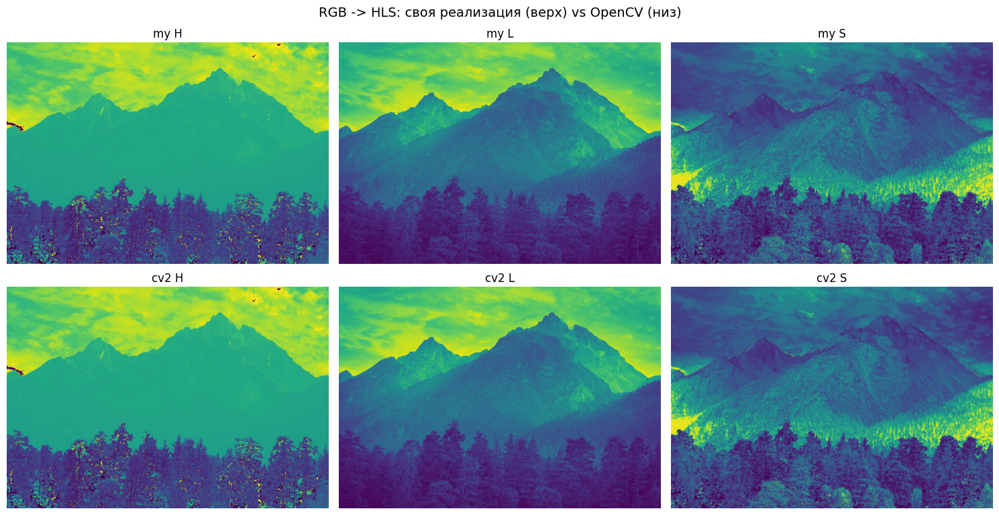

In [4]:
def my_rgb2hls(img):
    f = img.astype(np.float64) / 255.0
    R, G, B = f[:,:,0], f[:,:,1], f[:,:,2]

    Cmax = np.max(f, axis=2)
    Cmin = np.min(f, axis=2)
    delta = Cmax - Cmin

    L = (Cmax + Cmin) / 2

    S = np.zeros_like(L)
    mask = delta > 0
    m1 = mask & (L <= 0.5)
    S[m1] = delta[m1] / (Cmax[m1] + Cmin[m1])
    m2 = mask & (L > 0.5)
    S[m2] = delta[m2] / (2.0 - Cmax[m2] - Cmin[m2])

    H = np.zeros_like(Cmax)
    m = mask & (Cmax == R)
    H[m] = 60.0 * (((G[m] - B[m]) / delta[m]) % 6)
    m = mask & (Cmax == G)
    H[m] = 60.0 * ((B[m] - R[m]) / delta[m] + 2)
    m = mask & (Cmax == B)
    H[m] = 60.0 * ((R[m] - G[m]) / delta[m] + 4)

    hls = np.stack([H / 2, L * 255, S * 255], axis=2)
    return np.clip(hls, 0, 255).astype(np.uint8)

my_hls = my_rgb2hls(img_rgb)
cv_hls = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HLS)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for i, name in enumerate(['H', 'L', 'S']):
    axes[0, i].imshow(my_hls[:,:,i])
    axes[0, i].set_title(f'my {name}')
    axes[0, i].axis('off')
    axes[1, i].imshow(cv_hls[:,:,i])
    axes[1, i].set_title(f'cv2 {name}')
    axes[1, i].axis('off')
plt.suptitle('RGB -> HLS: своя реализация (верх) vs OpenCV (низ)', fontsize=14)
plt.tight_layout()
plt.show()

---
## 2. Blending изображений

Формула: `dst = α · img1 + β · img2 + γ`

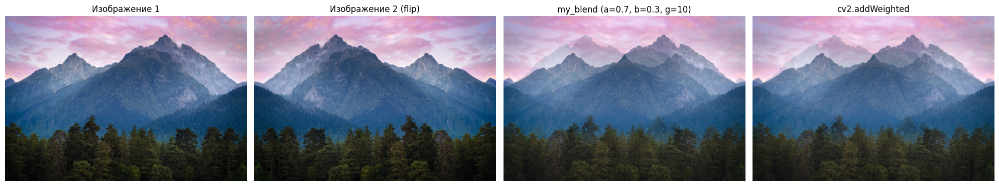

In [5]:
def my_blend(img1, img2, alpha, beta, gamma):
    result = alpha * img1.astype(np.float64) + beta * img2.astype(np.float64) + gamma
    return np.clip(result, 0, 255).astype(np.uint8)

img2_rgb = img_rgb[:, ::-1, :].copy()

alpha, beta, gamma = 0.7, 0.3, 10

my_blended = my_blend(img_rgb, img2_rgb, alpha, beta, gamma)
cv_blended = cv2.addWeighted(img_bgr, alpha, cv2.cvtColor(img2_rgb, cv2.COLOR_RGB2BGR), beta, gamma)
cv_blended_rgb = cv2.cvtColor(cv_blended, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(img_rgb)
axes[0].set_title('Изображение 1')
axes[0].axis('off')
axes[1].imshow(img2_rgb)
axes[1].set_title('Изображение 2 (flip)')
axes[1].axis('off')
axes[2].imshow(my_blended)
axes[2].set_title(f'my_blend (a={alpha}, b={beta}, g={gamma})')
axes[2].axis('off')
axes[3].imshow(cv_blended_rgb)
axes[3].set_title('cv2.addWeighted')
axes[3].axis('off')
plt.tight_layout()
plt.show()

---
## 3. Пороговая обработка

### Реализация пороговых функций

In [6]:
def my_threshold_binary(img, thresh, maxval=255):
    return np.where(img > thresh, maxval, 0).astype(np.uint8)

def my_threshold_binary_inv(img, thresh, maxval=255):
    return np.where(img > thresh, 0, maxval).astype(np.uint8)

def my_threshold_tozero(img, thresh):
    return np.where(img > thresh, img, 0).astype(np.uint8)

def my_threshold_tozero_inv(img, thresh):
    return np.where(img > thresh, 0, img).astype(np.uint8)

def my_threshold_trunc(img, thresh):
    return np.where(img > thresh, thresh, img).astype(np.uint8)

print('Пороговые функции определены.')

Пороговые функции определены.


### Демонстрация и сравнение с OpenCV

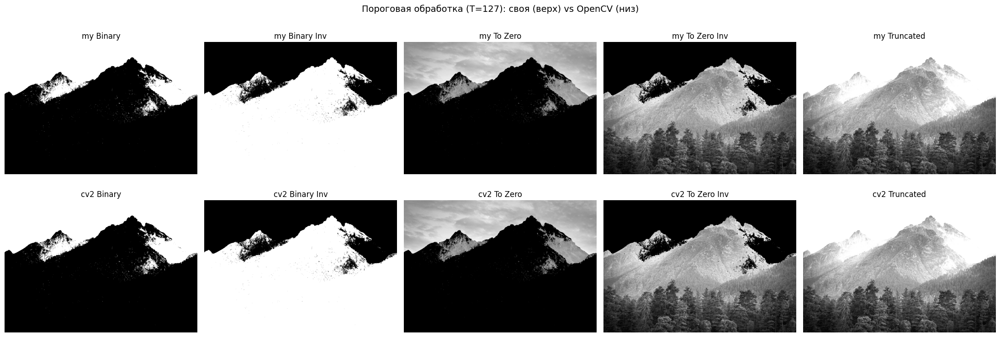

In [7]:
T = 127

my_results = [
    ('Binary', my_threshold_binary(gray, T)),
    ('Binary Inv', my_threshold_binary_inv(gray, T)),
    ('To Zero', my_threshold_tozero(gray, T)),
    ('To Zero Inv', my_threshold_tozero_inv(gray, T)),
    ('Truncated', my_threshold_trunc(gray, T)),
]

cv_types = [
    cv2.THRESH_BINARY,
    cv2.THRESH_BINARY_INV,
    cv2.THRESH_TOZERO,
    cv2.THRESH_TOZERO_INV,
    cv2.THRESH_TRUNC,
]

fig, axes = plt.subplots(2, 5, figsize=(22, 8))
for i, ((name, my_img), cv_type) in enumerate(zip(my_results, cv_types)):
    _, cv_img = cv2.threshold(gray, T, 255, cv_type)
    axes[0, i].imshow(my_img, cmap='gray')
    axes[0, i].set_title(f'my {name}')
    axes[0, i].axis('off')
    axes[1, i].imshow(cv_img, cmap='gray')
    axes[1, i].set_title(f'cv2 {name}')
    axes[1, i].axis('off')
plt.suptitle(f'Пороговая обработка (T={T}): своя (верх) vs OpenCV (низ)', fontsize=14)
plt.tight_layout()
plt.show()

---
## 4. Размытие и сглаживание

### Вспомогательные функции: свёртка и ядро Гаусса

In [8]:
def make_gaussian_kernel(size, sigma=None):
    if sigma is None:
        sigma = 0.3 * ((size - 1) * 0.5 - 1) + 0.8
    k = size // 2
    y, x = np.mgrid[-k:k+1, -k:k+1]
    g = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    return g / g.sum()

def my_filter2d(img, kernel):
    kh, kw = kernel.shape
    pad_h, pad_w = kh // 2, kw // 2
    img_f = img.astype(np.float64)

    if img.ndim == 2:
        padded = np.pad(img_f, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')
        h, w = img.shape
        output = np.zeros((h, w), dtype=np.float64)
        for di in range(kh):
            for dj in range(kw):
                output += padded[di:di+h, dj:dj+w] * kernel[di, dj]
    else:
        padded = np.pad(img_f, ((pad_h, pad_h), (pad_w, pad_w), (0, 0)), mode='reflect')
        h, w = img.shape[:2]
        output = np.zeros((h, w, img.shape[2]), dtype=np.float64)
        for di in range(kh):
            for dj in range(kw):
                output += padded[di:di+h, dj:dj+w] * kernel[di, dj]
    return output

k = make_gaussian_kernel(5)
print('Гауссовское ядро 5x5:')
print(np.round(k, 4))
print('Сумма:', round(k.sum(), 6))

Гауссовское ядро 5x5:
[[0.005  0.0173 0.0262 0.0173 0.005 ]
 [0.0173 0.0598 0.0903 0.0598 0.0173]
 [0.0262 0.0903 0.1366 0.0903 0.0262]
 [0.0173 0.0598 0.0903 0.0598 0.0173]
 [0.005  0.0173 0.0262 0.0173 0.005 ]]
Сумма: 1.0


### Гауссовская адаптивная пороговая обработка

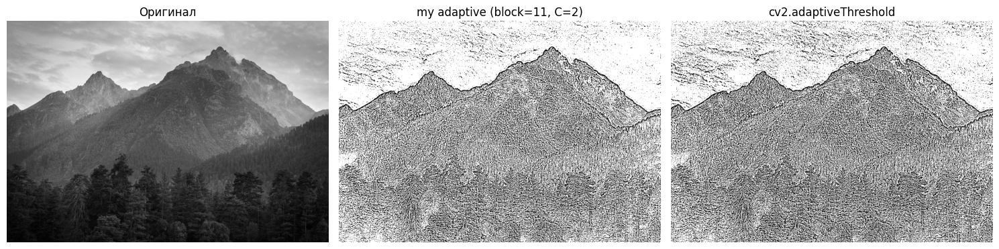

In [9]:
def my_adaptive_gaussian(img, maxval, block_size, C):
    kernel = make_gaussian_kernel(block_size)
    local_mean = my_filter2d(img, kernel)
    return np.where(img.astype(np.float64) > local_mean - C, maxval, 0).astype(np.uint8)

block_size, C = 11, 2

my_adapt = my_adaptive_gaussian(gray, 255, block_size, C)
cv_adapt = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                  cv2.THRESH_BINARY, block_size, C)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(gray, cmap='gray')
axes[0].set_title('Оригинал')
axes[0].axis('off')
axes[1].imshow(my_adapt, cmap='gray')
axes[1].set_title(f'my adaptive (block={block_size}, C={C})')
axes[1].axis('off')
axes[2].imshow(cv_adapt, cmap='gray')
axes[2].set_title('cv2.adaptiveThreshold')
axes[2].axis('off')
plt.tight_layout()
plt.show()

### Применение собственного фильтра

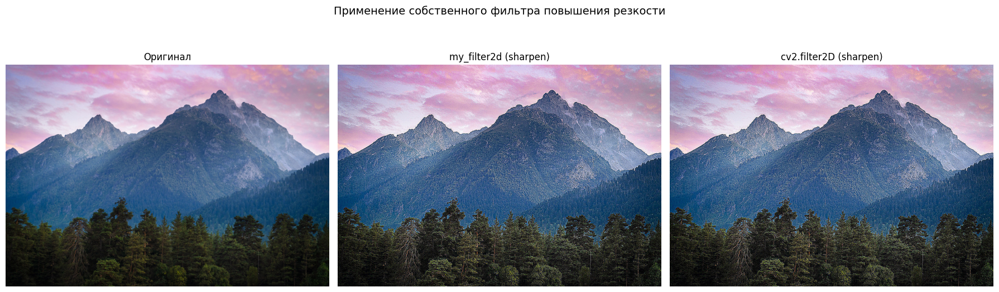

Ядро: [[-1.0, -1.0, -1.0], [-1.0, 9.0, -1.0], [-1.0, -1.0, -1.0]]


In [ ]:
sharpen_kernel = np.array([[-1, -1, -1],
                           [-1,  9, -1],
                           [-1, -1, -1]], dtype=np.float64)

my_sharp = np.clip(my_filter2d(img_rgb, sharpen_kernel), 0, 255).astype(np.uint8)
cv_sharp = cv2.filter2D(img_rgb, -1, sharpen_kernel)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(img_rgb)
axes[0].set_title('Оригинал')
axes[0].axis('off')
axes[1].imshow(my_sharp)
axes[1].set_title('my_filter2d (sharpen)')
axes[1].axis('off')
axes[2].imshow(cv_sharp)
axes[2].set_title('cv2.filter2D (sharpen)')
axes[2].axis('off')
plt.suptitle('Применение собственного фильтра повышения резкости', fontsize=14)
plt.tight_layout()
plt.show()

print('Ядро:', sharpen_kernel.tolist())

### Медианное размытие

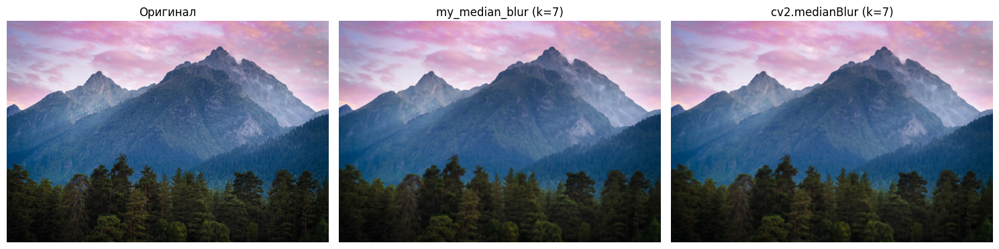

In [11]:
def my_median_blur(img, ksize):
    k = ksize // 2
    if img.ndim == 2:
        h, w = img.shape
        padded = np.pad(img, ((k, k), (k, k)), mode='reflect')
        patches = np.zeros((h, w, ksize * ksize), dtype=img.dtype)
        idx = 0
        for di in range(ksize):
            for dj in range(ksize):
                patches[:, :, idx] = padded[di:di+h, dj:dj+w]
                idx += 1
        return np.median(patches, axis=2).astype(np.uint8)
    else:
        result = np.zeros_like(img)
        for c in range(img.shape[2]):
            result[:,:,c] = my_median_blur(img[:,:,c], ksize)
        return result

ksize = 7

my_med = my_median_blur(img_rgb, ksize)
cv_med = cv2.cvtColor(cv2.medianBlur(img_bgr, ksize), cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img_rgb)
axes[0].set_title('Оригинал')
axes[0].axis('off')
axes[1].imshow(my_med)
axes[1].set_title(f'my_median_blur (k={ksize})')
axes[1].axis('off')
axes[2].imshow(cv_med)
axes[2].set_title(f'cv2.medianBlur (k={ksize})')
axes[2].axis('off')
plt.tight_layout()
plt.show()

### Гауссовское размытие (с генерацией ядра)

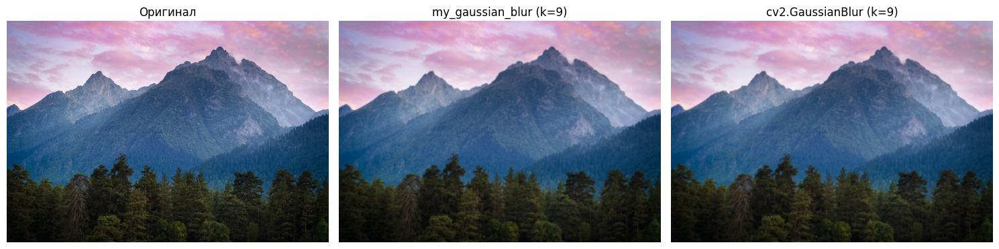

In [12]:
def my_gaussian_blur(img, ksize, sigma=None):
    kernel = make_gaussian_kernel(ksize, sigma)
    return np.clip(my_filter2d(img, kernel), 0, 255).astype(np.uint8)

ksize = 9

my_gauss = my_gaussian_blur(img_rgb, ksize)
cv_gauss = cv2.cvtColor(cv2.GaussianBlur(img_bgr, (ksize, ksize), 0), cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img_rgb)
axes[0].set_title('Оригинал')
axes[0].axis('off')
axes[1].imshow(my_gauss)
axes[1].set_title(f'my_gaussian_blur (k={ksize})')
axes[1].axis('off')
axes[2].imshow(cv_gauss)
axes[2].set_title(f'cv2.GaussianBlur (k={ksize})')
axes[2].axis('off')
plt.tight_layout()
plt.show()

---
## 5. Фильтр Собеля

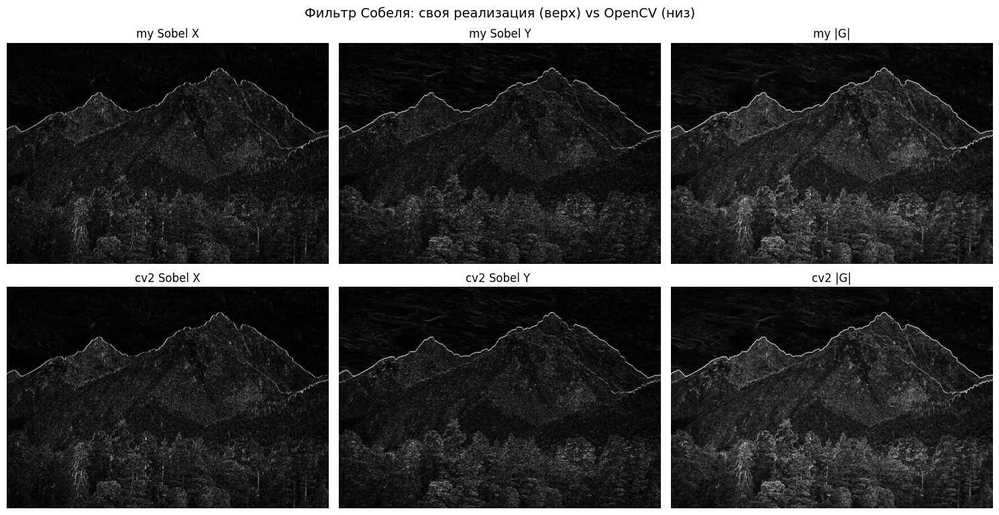

In [13]:
def my_sobel(img):
    kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float64)
    ky = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=np.float64)
    gx = my_filter2d(img, kx)
    gy = my_filter2d(img, ky)
    magnitude = np.sqrt(gx**2 + gy**2)
    return np.clip(magnitude, 0, 255).astype(np.uint8), gx, gy

my_sobel_img, my_gx, my_gy = my_sobel(gray)

cv_gx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
cv_gy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
cv_sobel_img = np.clip(np.sqrt(cv_gx**2 + cv_gy**2), 0, 255).astype(np.uint8)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

axes[0, 0].imshow(np.clip(np.abs(my_gx), 0, 255).astype(np.uint8), cmap='gray')
axes[0, 0].set_title('my Sobel X')
axes[0, 0].axis('off')
axes[0, 1].imshow(np.clip(np.abs(my_gy), 0, 255).astype(np.uint8), cmap='gray')
axes[0, 1].set_title('my Sobel Y')
axes[0, 1].axis('off')
axes[0, 2].imshow(my_sobel_img, cmap='gray')
axes[0, 2].set_title('my |G|')
axes[0, 2].axis('off')

axes[1, 0].imshow(np.clip(np.abs(cv_gx), 0, 255).astype(np.uint8), cmap='gray')
axes[1, 0].set_title('cv2 Sobel X')
axes[1, 0].axis('off')
axes[1, 1].imshow(np.clip(np.abs(cv_gy), 0, 255).astype(np.uint8), cmap='gray')
axes[1, 1].set_title('cv2 Sobel Y ')
axes[1, 1].axis('off')
axes[1, 2].imshow(cv_sobel_img, cmap='gray')
axes[1, 2].set_title('cv2 |G|')
axes[1, 2].axis('off')

plt.suptitle('Фильтр Собеля: своя реализация (верх) vs OpenCV (низ)', fontsize=14)
plt.tight_layout()
plt.show()

---
## 6. Эквализация гистограммы

### Расчёт гистограммы и кумулятивной функции распределения

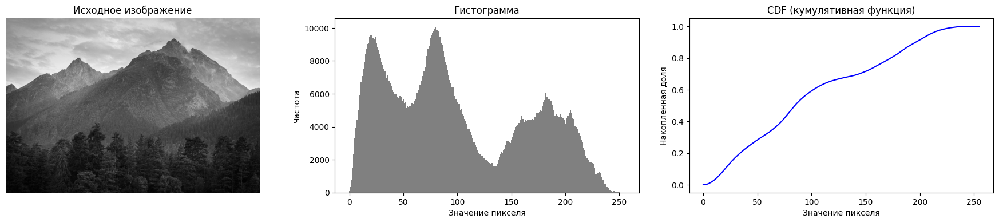

In [ ]:
def my_calc_hist(img):
    hist = np.zeros(256, dtype=np.int64)
    for val in img.ravel():
        hist[val] += 1
    return hist

hist = my_calc_hist(gray)
cdf = np.cumsum(hist)
cdf_norm = cdf / cdf[-1]

fig, axes = plt.subplots(1, 3, figsize=(18, 4))

axes[0].imshow(gray, cmap='gray')
axes[0].set_title('Исходное изображение')
axes[0].axis('off')

axes[1].bar(range(256), hist, color='gray', width=1)
axes[1].set_title('Гистограмма')
axes[1].set_xlabel('Значение пикселя')
axes[1].set_ylabel('Частота')

axes[2].plot(cdf_norm, color='blue')
axes[2].set_title('CDF (кумулятивная функция)')
axes[2].set_xlabel('Значение пикселя')
axes[2].set_ylabel('Накопленная доля')

plt.tight_layout()
plt.show()

### Эквализация и сравнение с OpenCV

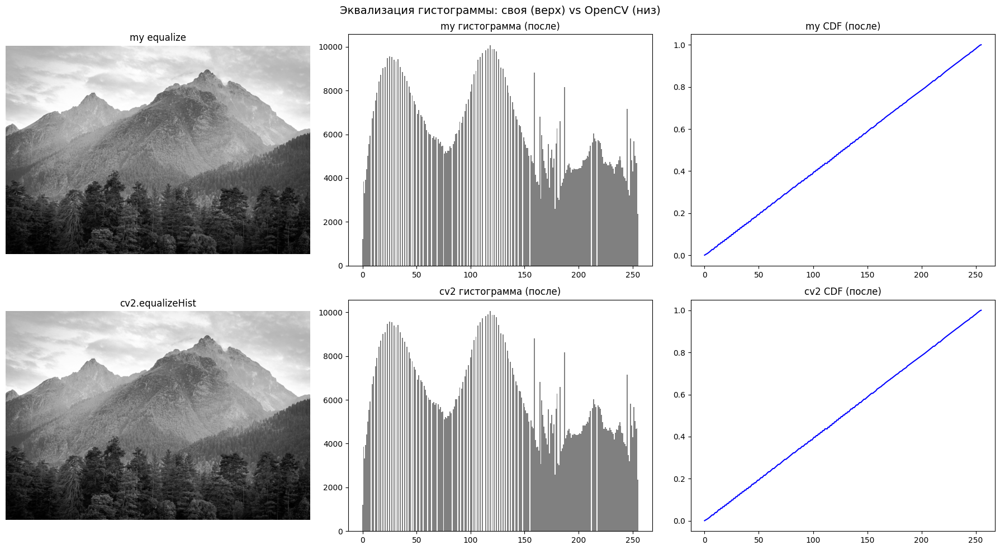

In [15]:
def my_equalize_hist(img):
    hist = my_calc_hist(img)
    cdf = np.cumsum(hist)
    cdf_min = cdf[cdf > 0].min()
    total = img.size
    lut = np.round((cdf - cdf_min) / (total - cdf_min) * 255).astype(np.uint8)
    return lut[img]

my_eq = my_equalize_hist(gray)
cv_eq = cv2.equalizeHist(gray)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

axes[0, 0].imshow(my_eq, cmap='gray')
axes[0, 0].set_title('my equalize')
axes[0, 0].axis('off')

my_hist_eq = my_calc_hist(my_eq)
axes[0, 1].bar(range(256), my_hist_eq, color='gray', width=1)
axes[0, 1].set_title('my гистограмма (после)')

my_cdf_eq = np.cumsum(my_hist_eq) / my_eq.size
axes[0, 2].plot(my_cdf_eq, color='blue')
axes[0, 2].set_title('my CDF (после)')

axes[1, 0].imshow(cv_eq, cmap='gray')
axes[1, 0].set_title('cv2.equalizeHist')
axes[1, 0].axis('off')

cv_hist_eq = my_calc_hist(cv_eq)
axes[1, 1].bar(range(256), cv_hist_eq, color='gray', width=1)
axes[1, 1].set_title('cv2 гистограмма (после)')

cv_cdf_eq = np.cumsum(cv_hist_eq) / cv_eq.size
axes[1, 2].plot(cv_cdf_eq, color='blue')
axes[1, 2].set_title('cv2 CDF (после)')

plt.suptitle('Эквализация гистограммы: своя (верх) vs OpenCV (низ)', fontsize=14)
plt.tight_layout()
plt.show()